In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cufflinks as cf
import matplotlib as mpl
from plotly.offline import download_plotlyjs, init_notebook_mode, plot ,iplot
import plotly.plotly as py
import plotly.graph_objs as go
import plotly.figure_factory as ff
from plotly.tools import FigureFactory as FF
import json

In [2]:
from plotly import __version__
print (__version__)

from cufflinks import __version__
print (__version__)

3.4.2
0.14.6


In [3]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot ,iplot
print (__version__)


3.4.2


In [4]:
init_notebook_mode(connected=True)
cf.go_offline()

In [5]:
cwur=pd.read_csv('C:/Users/Administrator/Documents/cwurData.csv')
cwur.head()

,world_rank,institution,country,national_rank,quality_of_education,alumni_employment,quality_of_faculty,publications,influence,citations,broad_impact,patents,score,year
0,1,Harvard University,USA,1,7,9,1,1,1,1,NaN,5,100.00,2012
1,2,Massachusetts Institute of Technology,USA,2,9,17,3,12,4,4,NaN,1,91.67,2012
2,3,Stanford University,USA,3,17,11,5,4,2,2,NaN,15,89.50,2012
3,4,University of Cambridge,United Kingdom,1,10,24,4,16,16,11,NaN,50,86.17,2012
4,5,California Institute of Technology,USA,4,2,29,7,37,22,22,NaN,18,85.21,2012


In [6]:
cwur.columns

Index(['world_rank', 'institution', 'country', 'national_rank',
       'quality_of_education', 'alumni_employment', 'quality_of_faculty',
       'publications', 'influence', 'citations', 'broad_impact', 'patents',
       'score', 'year'],
      dtype='object')

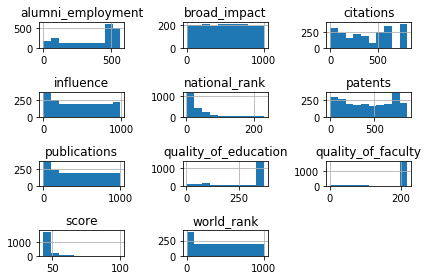

In [7]:
plt.figure(figsize=(55,55))
cwur[['world_rank','national_rank','quality_of_education','alumni_employment','quality_of_faculty','publications','influence',
      'citations','broad_impact','patents','score']].hist()
plt.tight_layout()
plt.show()

In [8]:
data=dict(type='choropleth',
          colorscale='Portland',
          locations=cwur['country'],#world['CODE'],
          z=cwur['world_rank'],
          colorbar={'title':'UNIVERSITIES'})


layout=dict(title='2012-2015 universities of world',
           geo=dict(showframe=False,
                    showcoastlines=True,
                    projection=dict(type='orthographic')))

choromap=dict(data=[data],layout=layout)

iplot(choromap)

# FEW THINGS TO KNOW BEFORE PROCEED

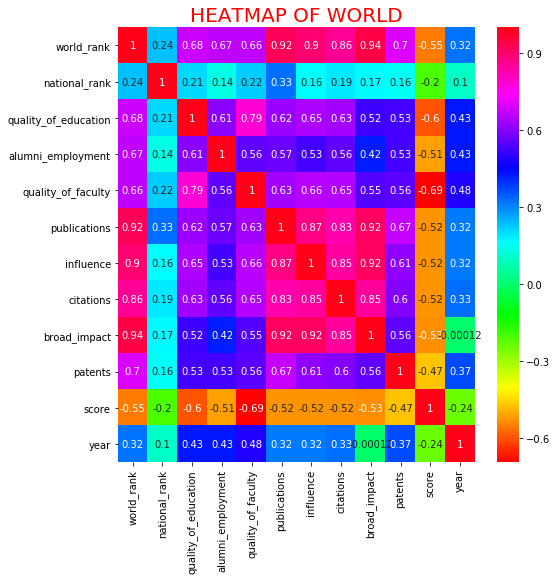

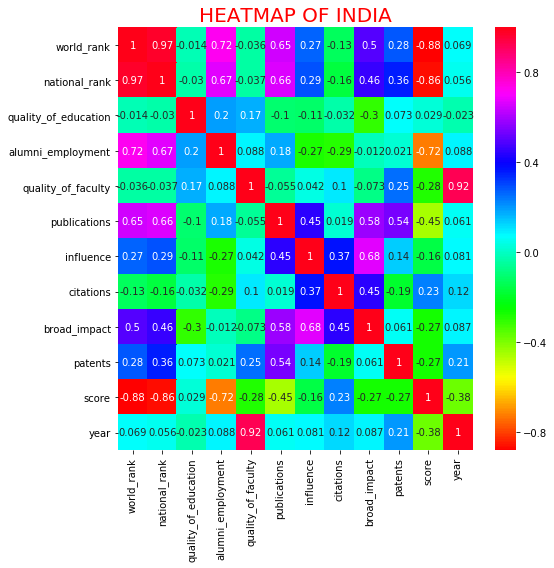

In [10]:
IND=cwur[cwur.country=='India']

plt.figure(figsize=(8,8))
cwur.corr()
sns.heatmap(cwur.corr(),annot=True,cmap='hsv')
plt.title('HEATMAP OF WORLD',color='r',size=20)
plt.show()

plt.figure(figsize=(8,8))
IND.corr()
sns.heatmap(IND.corr(),annot=True,cmap='hsv')
plt.title('HEATMAP OF INDIA',color='r',size=20)
plt.tight_layout()
plt.show()

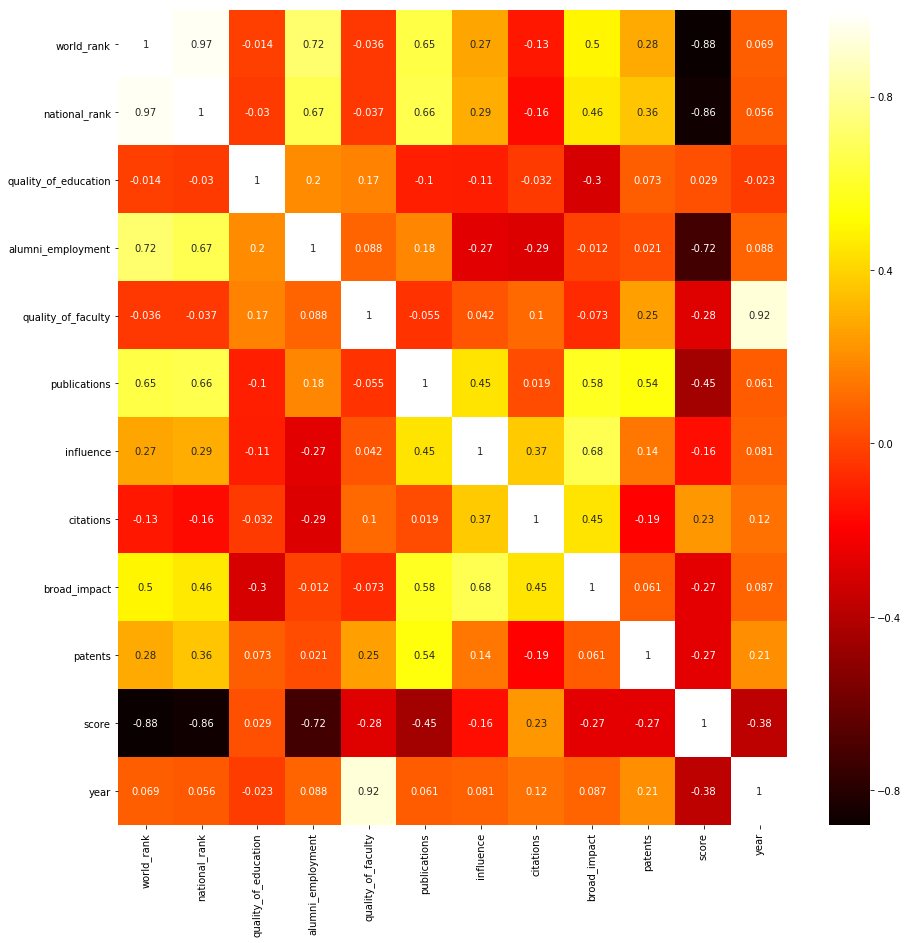

In [11]:
IND=cwur[cwur.country=='India']
plt.figure(figsize=(15,15))
IND.corr()
sns.heatmap(IND.corr(),annot=True,cmap='hot')
plt.show()

# Q1. Top 10 countries and Institute on the basis of World Ranking for all years.

In [12]:
a1=cwur[cwur.year==2012][['world_rank','institution','country']].sort_values(by='world_rank',ascending=True).head(10)
a2=cwur[cwur.year==2013][['world_rank','institution','country']].sort_values(by='world_rank',ascending=True).head(10)
a3=cwur[cwur.year==2014][['world_rank','institution','country']].sort_values(by='world_rank',ascending=True).head(10)
a4=cwur[cwur.year==2015][['world_rank','institution','country']].sort_values(by='world_rank',ascending=True).head(10)


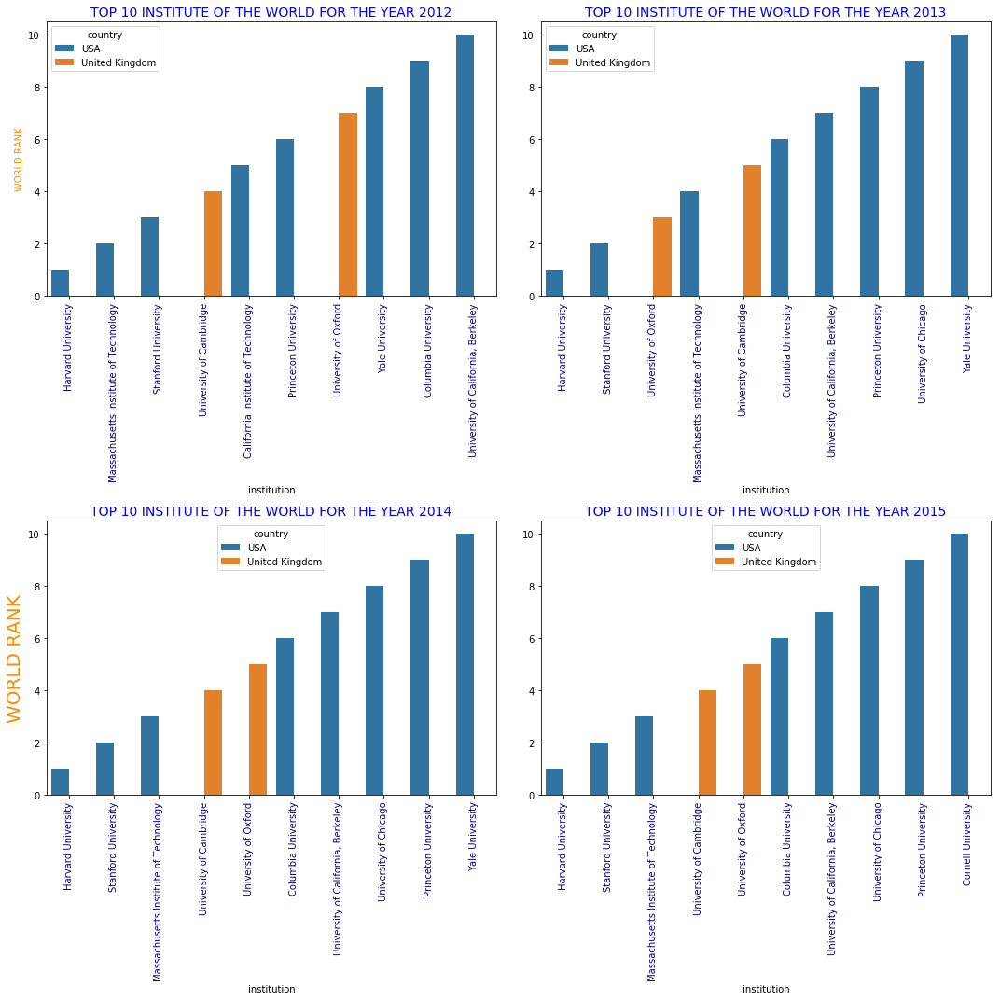

In [13]:
plt.figure(figsize=(15,15))
plt.subplot(2,2,1)
sns.barplot(x='institution',y='world_rank',hue='country',data=a1)
plt.xticks(rotation=90,fontsize=10,color='darkblue')
plt.title('TOP 10 INSTITUTE OF THE WORLD FOR THE YEAR 2012',fontsize=14,color='blue')
plt.ylabel('WORLD RANK',fontsize=10,color='darkorange')

plt.subplot(2,2,2)
sns.barplot(x='institution',y='world_rank',hue='country',data=a2)
plt.xticks(rotation=90,fontsize=10,color='darkblue')
plt.title('TOP 10 INSTITUTE OF THE WORLD FOR THE YEAR 2013',fontsize=14,color='blue')
plt.ylabel(' ')

plt.subplot(2,2,3)
sns.barplot(x='institution',y='world_rank',hue='country',data=a3)
plt.xticks(rotation=90,fontsize=10,color='darkblue')
plt.title('TOP 10 INSTITUTE OF THE WORLD FOR THE YEAR 2014',fontsize=14,color='blue')
plt.ylabel('WORLD RANK',fontsize=20,color='darkorange')

plt.subplot(2,2,4)
sns.barplot(x='institution',y='world_rank',hue='country',data=a4)
plt.xticks(rotation=90,fontsize=10,color='darkblue')
plt.title('TOP 10 INSTITUTE OF THE WORLD FOR THE YEAR 2015',fontsize=14,color='blue')
plt.ylabel(' ')


plt.tight_layout()
plt.show()

# UNDER TOP 10 UNIVERSITIES OF WORLD:
IN 2012:
USA HAS 8 INSTITUTES WHERE AS UK HAS 2 ON THE POSITION OF 4TH AND 7TH

IN 2013:
SAME AS BEFOR 8 FOR US AND 2 FOR UK BUT THIS TIME UK'S INSTITUTE WERE AT 3RD AND5TH POSTION

IN 2014:
SAME AS BEFOR 8 FOR US AND 2 FOR UK BUT THIS TIME UK'S INSTITUTE WERE AT 4TH AND 5TH POSTION


IN 2015:
SAME AS BEFOR 8 FOR US AND 2 FOR UK BUT THIS TIME UK'S INSTITUTE WERE AT 4TH AND 5TH POSTION

# Q2. Top 10 Indian Institute on the basis of World Ranking for all years.

In [14]:
b1=cwur[(cwur.country=='India')&((cwur.year==2014)|(cwur.year==2015))][['world_rank','institution','year','national_rank']]

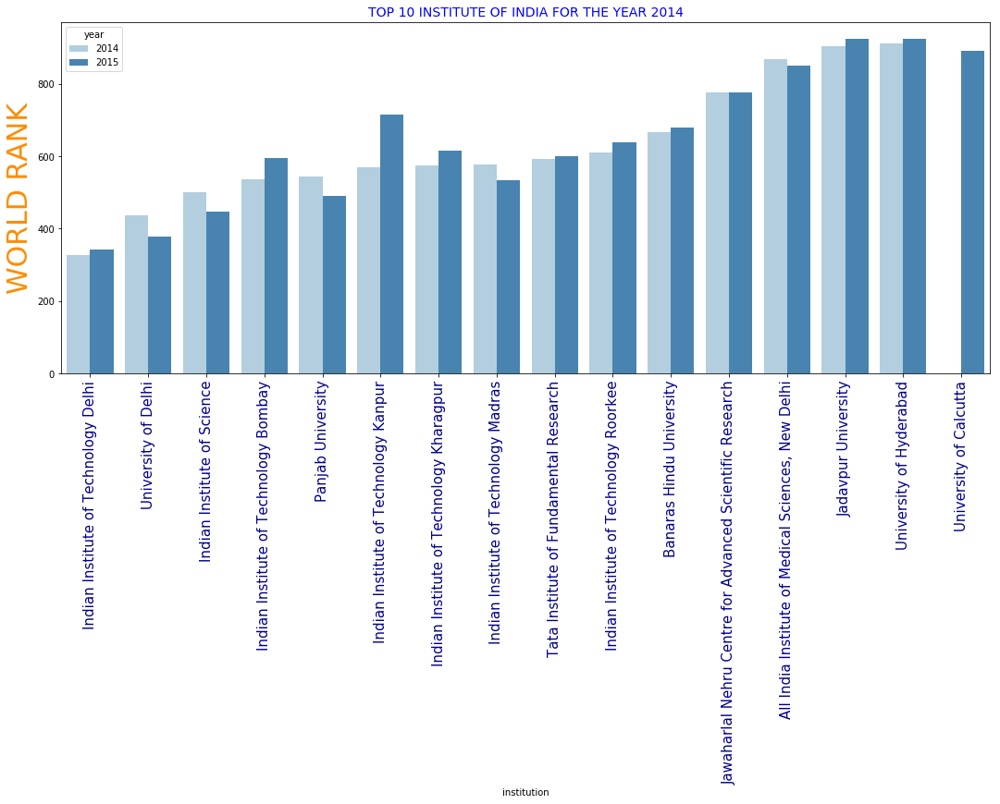

In [15]:
plt.figure(figsize=(18,7))
sns.barplot(x='institution',y='world_rank',hue='year',data=b1,palette='Blues')
plt.xticks(rotation=90,fontsize=15,color='darkblue')
plt.title('TOP 10 INSTITUTE OF INDIA FOR THE YEAR 2014',fontsize=14,color='blue')
plt.ylabel('WORLD RANK',fontsize=30,color='darkorange')
plt.show()

# Top 10 Indian Institute on the basis of World Ranking for all years.
1. FOR 2014:

 ALL INDIA INSTITUTE OF MEDICAL SCIENCE, NEW DELHI, JADAVPUR UNIVERSITY, UNIVEERSITY OF HYDERABAD ARE THE TOP MOST INSTITUTES OF INDIA,

2. FOR 2015:

 UNIVERSITY OF CALCUTTA,JADAVPUR UNIVERSITY, UNIVEERSITY OF HYDERABAD ARE THE TOP MOST INSTITUTES OF INDIA

 WE CAN SEE THAT UNIVERSITY OF CALCUTTA BEATS ALL INDIA INSTITUTE OF MEDICAL SCIENCE, NEW DELHI IN 2015.


# Q3. NATIONAL RANKS OF INDIAN INSTITUTIONS.

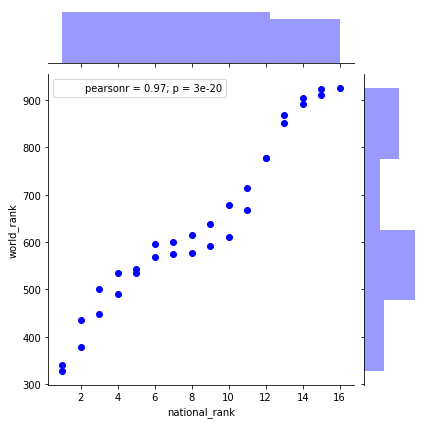

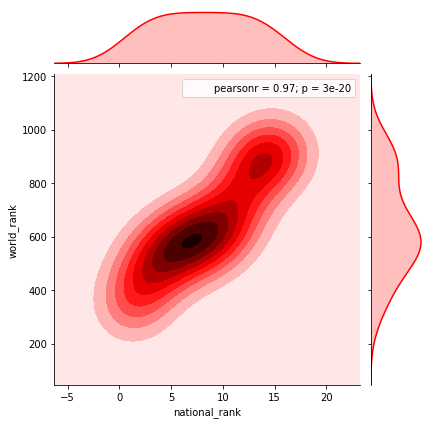

In [16]:
c=cwur[(cwur.country=='India')&((cwur.year==2014)|(cwur.year==2015))].sort_values('national_rank')[['year','world_rank','institution','national_rank']]
sns.jointplot(x='national_rank',y='world_rank',data=c,kind='scatter',color='b')
sns.jointplot(x='national_rank',y='world_rank',data=c,kind='kde',color='red')
plt.show()

###### FROM THE ABOVE TWO GRAPG IS IC CLEAR THAT DATA SHOWS BELL CURVE AND DATA IS SHOWING H LINEAR MODEL WHICH MEANS STRONG RELATION B/W  NATIONAL AND WORLD RANK

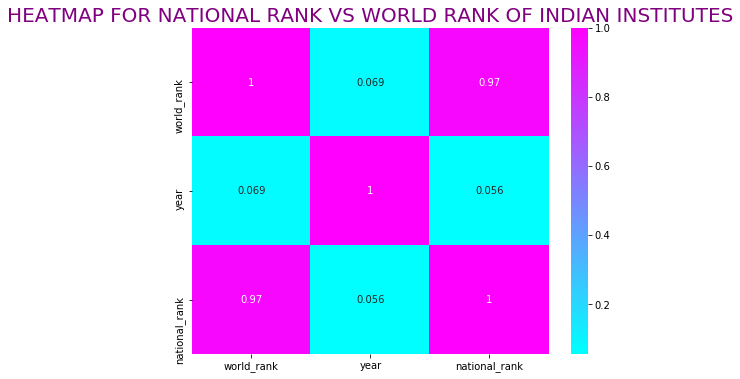

In [17]:
plt.figure(figsize=(8,6))
b1.corr()
sns.heatmap(b1.corr(),annot=True,cmap='cool')
plt.title('HEATMAP FOR NATIONAL RANK VS WORLD RANK OF INDIAN INSTITUTES',color='purple',size=20)
plt.show()

###### FROM ABOVE WE CAN SEE THAT THERE IS AN STRONG RELATION B/W WORLD RANK AND NATIONAL RANK. BUT IT IS NOT EQUAL TO 1 THAT SHOWS THERE ARE SOME INSTITUTES WHICH ARE NOT RANKED AS PER WORLS RANK AND RANKED DIFFRENTLY IN NATION LEVEL

# Q4.INSTITUTE WISE NO OF PATENTS OF WORLD

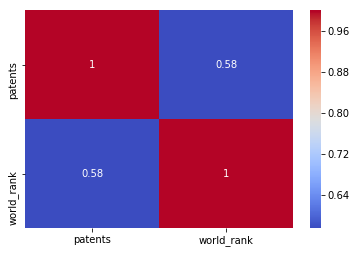

In [18]:
d1=cwur[cwur.year==2012][['country','institution','patents','world_rank']].sort_values(by='world_rank',ascending=True)#.head(20)
d1.pivot(columns='country',values='patents').iplot(kind='box',boxpoints='outliers',theme='space',xTitle='COUNTRIES',yTitle='PATENTS',title='INSTITUTE WISE NO OF PATENTS OF WORLD FOR THE YEAR 2012')
d1.iplot(kind='bar',x='country',y='patents',size=5,color='royalblue',theme='space',xTitle='COUNTRIES',yTitle='PATENTS',title='INSTITUTE WISE NO OF PATENTS OF WORLD FOR THE YEAR 2012')

d1.corr()
sns.heatmap(d1.corr(),annot=True,cmap='coolwarm')
plt.show()

# INSTITUTE WISE NO OF PATENTS OF WORLD
1. USA SHOWS WIDE RANGE OF PATENTS FOLLOWED BY UK AND SWITZERLAND,

2. WHERE AS WE CAN SEE IN BARS THAT USA,UK,SWITZERLAND,CANADA,FRANCE,SWEDEN,ITELEY,GERMANY,NETHERLANDS,FINLAND,NORWAY,DENMARK ALL HAS SAME NO OF PATENTS,

3. AND ALSO THERE IS NO SUCH GOOD RELATION B/W WORLD RANK AND PATENTS.

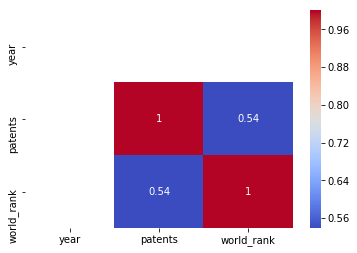

In [19]:
d2=cwur[cwur.year==2013][['year','country','institution','patents','world_rank']].sort_values(by='world_rank',ascending=True)#.head(20)
d2.pivot(columns='country',values='patents').iplot(kind='box',boxpoints='outliers',xTitle='COUNTRIES',yTitle='PATENTS',theme='space',title='INSTITUTE WISE NO OF PATENTS OF WORLD FOR THE YEAR 2013')
d2.iplot(kind='bar',x='country',y='patents',size=5,color='lightgreen',xTitle='COUNTRIES',yTitle='PATENTS',title='INSTITUTE WISE NO OF PATENTS OF WORLD FOR THE YEAR 2013',theme='space')

d2.corr()
sns.heatmap(d2.corr(),annot=True,cmap='coolwarm')
plt.show()

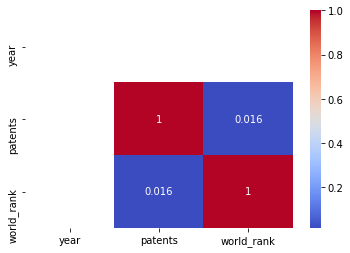

In [20]:
d3=cwur[cwur.year==2014][['year','country','institution','patents','world_rank']].sort_values(by='world_rank',ascending=True).head(20)
d3.pivot(columns='country',values='patents').iplot(kind='box',boxpoints='outliers',xTitle='COUNTRIES',yTitle='PATENTS',title='INSTITUTE WISE NO OF PATENTS OF WORLD FOR THE YEAR 2014',theme='space')
d3.iplot(kind='bar',x='country',y='patents',size=5,color='lightgrey',xTitle='COUNTRIES',yTitle='PATENTS',title='INSTITUTE WISE NO OF PATENTS OF WORLD FOR THE YEAR 2014',theme='space')

d3.corr()
sns.heatmap(d3.corr(),annot=True,cmap='coolwarm')
plt.show()

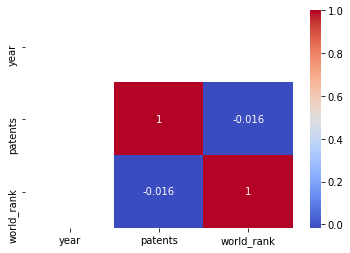

In [21]:
d4=cwur[cwur.year==2015][['year','country','institution','patents','world_rank']].sort_values(by='world_rank',ascending=True).head(20)
d4.pivot(columns='country',values='patents').iplot(kind='box',boxpoints='outliers',xTitle='COUNTRIES',yTitle='PATENTS',title='INSTITUTE WISE NO OF PATENTS OF WORLD FOR THE YEAR 2015',theme='space')
d4.iplot(kind='bar',x='country',y='patents',size=5,color='orange',xTitle='COUNTRIES',yTitle='PATENTS',title='INSTITUTE WISE NO OF PATENTS OF WORLD FOR THE YEAR 2015',theme='space')

d4.corr()
sns.heatmap(d4.corr(),annot=True,cmap='coolwarm')
plt.show()

# Q5. INDIAN UNIVERSITIES ON THE BASIS OF NO OF PATENTS

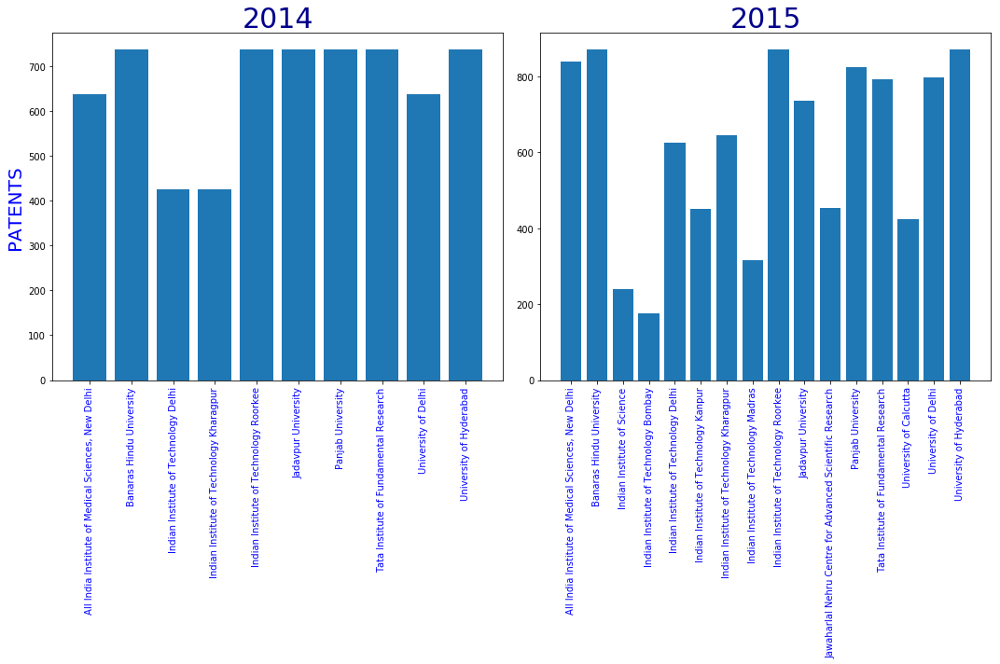

In [22]:
e1=cwur[(cwur.year==2014)&(cwur.country=='India')][['year','institution','patents']].sort_values(by='patents',ascending=False).head(10)
e2=cwur[(cwur.year==2015)&(cwur.country=='India')][['year','institution','patents']].sort_values(by='patents',ascending=False)
plt.figure(figsize=(15,10))

plt.subplot(1,2,1)
#sns.stripplot(x='institution',y='patents',data=e1,jitter=True)
plt.bar(e1['institution'],e1['patents'])
plt.xticks(rotation=90,fontsize=10,color='blue')
plt.ylabel('PATENTS',fontsize=20,color='blue')
plt.xlabel('')
plt.title('2014',fontsize=30,color='darkblue')

plt.subplot(1,2,2)
#sns.violinplot(x='institution',y='patents',data=e1)
plt.bar(e2['institution'],e2['patents'])
plt.xticks(rotation=90,fontsize=10,color='blue')
plt.ylabel('',fontsize=10,color='darkblue')
plt.xlabel('')
plt.title('2015',fontsize=30,color='darkblue')
          
plt.tight_layout()
plt.show()

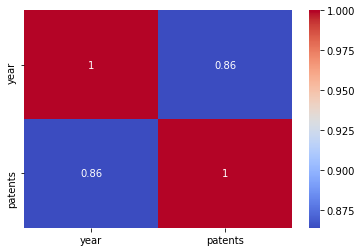

In [23]:
e=cwur[((cwur.year==2014)|(cwur.year==2015))&(cwur.country=='India')][['year','institution','patents']].sort_values(by='patents',ascending=False).head(10)
e.corr()
sns.heatmap(e.corr(),annot=True,cmap='coolwarm')
plt.show()

# Q6. RELATION B/W PATENTS AND PUBLICATION OF WORLD

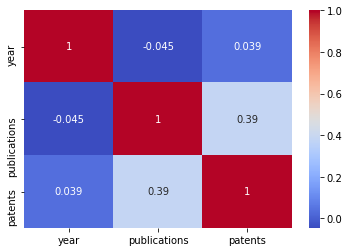

In [24]:
f=cwur[(cwur.year==2012)|(cwur.year==2013)|(cwur.year==2014)|(cwur.year==2015)][['year','institution', 'country','publications','patents']].sort_values(by='publications',ascending=False).head(25)
f.iplot(kind='bubble',x='publications',y='patents',size='publications',theme='space',xTitle='PUBLICATIONS',yTitle='PATENTS',title='RELATION B/W PATENTS AND PUBLICATION OF WORLD')

f.corr()
sns.heatmap(f.corr(),annot=True,cmap='coolwarm')
plt.show()

In [25]:
world=pd.read_csv('C:/Users/Administrator/Downloads/2014_World_GDP.csv')
data=dict(type='choropleth',
          colorscale='Portland',
          locations=f['country'],
          z=f['publications'],
          colorbar={'title':'UNIVERSITIES'})


layout=dict(title='2012-2015 universities of world',
           geo=dict(showframe=False,
                    showcoastlines=True,
                    projection=dict(type='orthographic')))

choromap=dict(data=[data],layout=layout)

iplot(choromap)

# 7. relation between no of publication and patents of India

In [26]:

g=cwur[((cwur.year==2014)|(cwur.year==2015))&(cwur.country=='India')][['institution','publications','patents']].sort_values(by='publications',ascending=False)
#print(g1)
#g2=cwur[&(cwur.country=='India')][['institution','publications','patents']].sort_values(by='publications',ascending=False)
#print(g2)

In [27]:
g.iplot(kind='bubble',x='publications',y='patents',size='publications',theme='space')

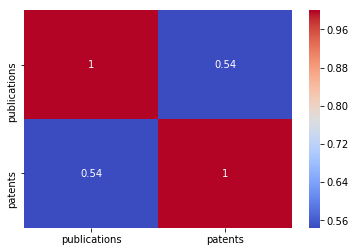

In [28]:
g.corr()
sns.heatmap(g.corr(),annot=True,cmap='coolwarm')
plt.show()

# 8. broad_impact year 2014 2015 world country wise

In [29]:
h1=cwur[cwur.year==2014][['country','broad_impact','institution']].sort_values(by='broad_impact',ascending=False).head(10)
#print(h1)
h2=cwur[cwur.year==2015][['country','broad_impact','institution']].sort_values(by='broad_impact',ascending=False).head(10)
#print(h2)


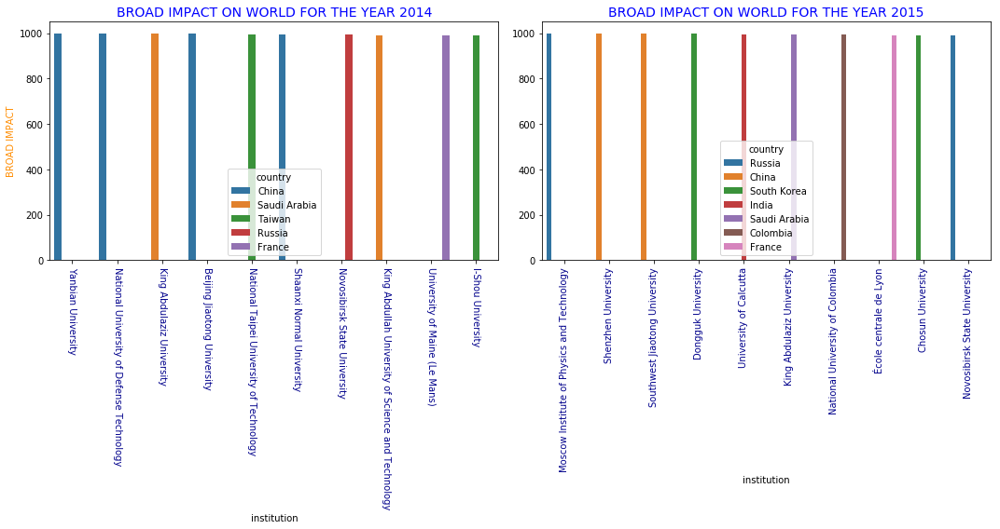

In [30]:
plt.figure(figsize=(15,8))
plt.subplot(1,2,1)
sns.barplot(x='institution',y='broad_impact',hue='country',data=h1)
plt.xticks(rotation=270,fontsize=10,color='darkblue')
plt.title('BROAD IMPACT ON WORLD FOR THE YEAR 2014',fontsize=14,color='blue')
plt.ylabel('BROAD IMPACT',fontsize=10,color='darkorange')

plt.subplot(1,2,2)
sns.barplot(x='institution',y='broad_impact',hue='country',data=h2)
plt.xticks(rotation=90,fontsize=10,color='darkblue')
plt.title('BROAD IMPACT ON WORLD FOR THE YEAR 2015',fontsize=14,color='blue')
plt.ylabel('BROAD IMPACT',fontsize=10,color='darkorange')
plt.ylabel('')

plt.tight_layout()
plt.show()

# 9. BROAD IMPACT ON INDIA

In [31]:
i1=cwur[(cwur.year==2014)&(cwur.country=='India')][['broad_impact','institution','country']].sort_values(by='broad_impact',ascending=False)
#print(i1)
i2=cwur[(cwur.year==2015)&(cwur.country=='India')][['broad_impact','institution','country']].sort_values(by='broad_impact',ascending=False)
#print(i2)

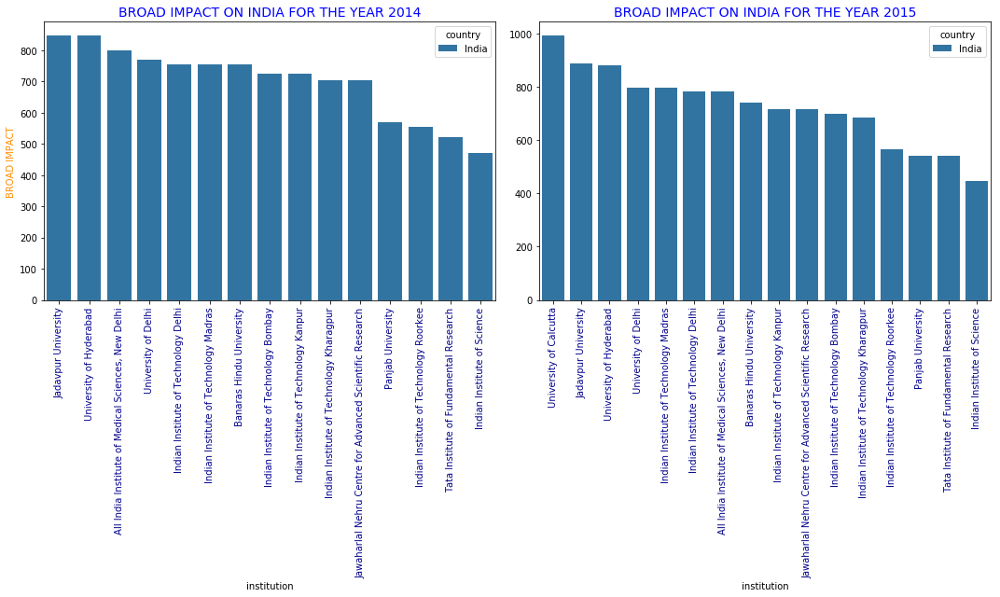

In [32]:
plt.figure(figsize=(15,9))
plt.subplot(1,2,1)
sns.barplot(x='institution',y='broad_impact',hue='country',data=i1)
plt.xticks(rotation=90,fontsize=10,color='darkblue')
plt.title('BROAD IMPACT ON INDIA FOR THE YEAR 2014',fontsize=14,color='blue')
plt.ylabel('BROAD IMPACT',fontsize=10,color='darkorange')

plt.subplot(1,2,2)
sns.barplot(x='institution',y='broad_impact',hue='country',data=i2)
plt.xticks(rotation=90,fontsize=10,color='darkblue')
plt.title('BROAD IMPACT ON INDIA FOR THE YEAR 2015',fontsize=14,color='blue')
plt.ylabel('',fontsize=10,color='darkorange')


plt.tight_layout()
plt.show()

# 10.citations wise world university

In [33]:

j1=cwur[cwur.year==2012][['citations','institution','country']].sort_values(by='citations',ascending=False)
j11=cwur[(cwur.year==2012)&(cwur.country=='France')][['citations','institution','country']].sort_values(by='citations',ascending=False)

j2=cwur[cwur.year==2013][['citations','institution','country']].sort_values(by='citations',ascending=False)
j22=cwur[(cwur.year==2013)&(cwur.country=='France')][['citations','institution','country']].sort_values(by='citations',ascending=False)

j3=cwur[cwur.year==2014][['citations','institution','country']].sort_values(by='citations',ascending=False)
j33=cwur[(cwur.year==2014)&((cwur.country=='China')|(cwur.country=='Finland')|(cwur.country=='South Africa')|(cwur.country=='Taiwan'))][['citations','institution','country']].sort_values(by='citations',ascending=False)

j4=cwur[cwur.year==2015][['citations','institution','country']].sort_values(by='citations',ascending=False)
j44=cwur[(cwur.year==2015)&((cwur.country=='Greece')|(cwur.country=='Japan')|(cwur.country=='Switzerland'))][['citations','institution','country']].sort_values(by='citations',ascending=False)

In [34]:
j1.pivot(columns='country',values='citations').iplot(kind='box',boxpoints='outliers',theme='space')
j11.pivot(columns='country',values='citations').iplot(kind='box',boxpoints='outliers',theme='space')

In [35]:
j2.pivot(columns='country',values='citations').iplot(kind='box',boxpoints='outliers',theme='space')
j22.pivot(columns='country',values='citations').iplot(kind='box',boxpoints='outliers',theme='space')

In [36]:
j3.pivot(columns='country',values='citations').iplot(kind='box',boxpoints='outliers',theme='space')
j33.pivot(columns='country',values='citations').iplot(kind='box',boxpoints='outliers',theme='space')

In [37]:
j4.pivot(columns='country',values='citations').iplot(kind='box',boxpoints='outliers',theme='space')
j44.pivot(columns='country',values='citations').iplot(kind='box',boxpoints='outliers',theme='space')

# 11.citations wise indian univ

In [38]:
k1=cwur[(cwur.year==2014)&(cwur.country=='India')][['citations','institution','year']].sort_values(by='citations',ascending=False)
#print(k1)
k1.pivot(columns='citations',values='institution').iplot(kind='box',boxpoints='outliers',theme='space')

In [39]:
k2=cwur[(cwur.year==2015)&(cwur.country=='India')][['citations','institution','year']].sort_values(by='citations',ascending=False)
#print(k2)
k2.pivot(columns='citations',values='institution').iplot(kind='box',boxpoints='outliers',theme='space')

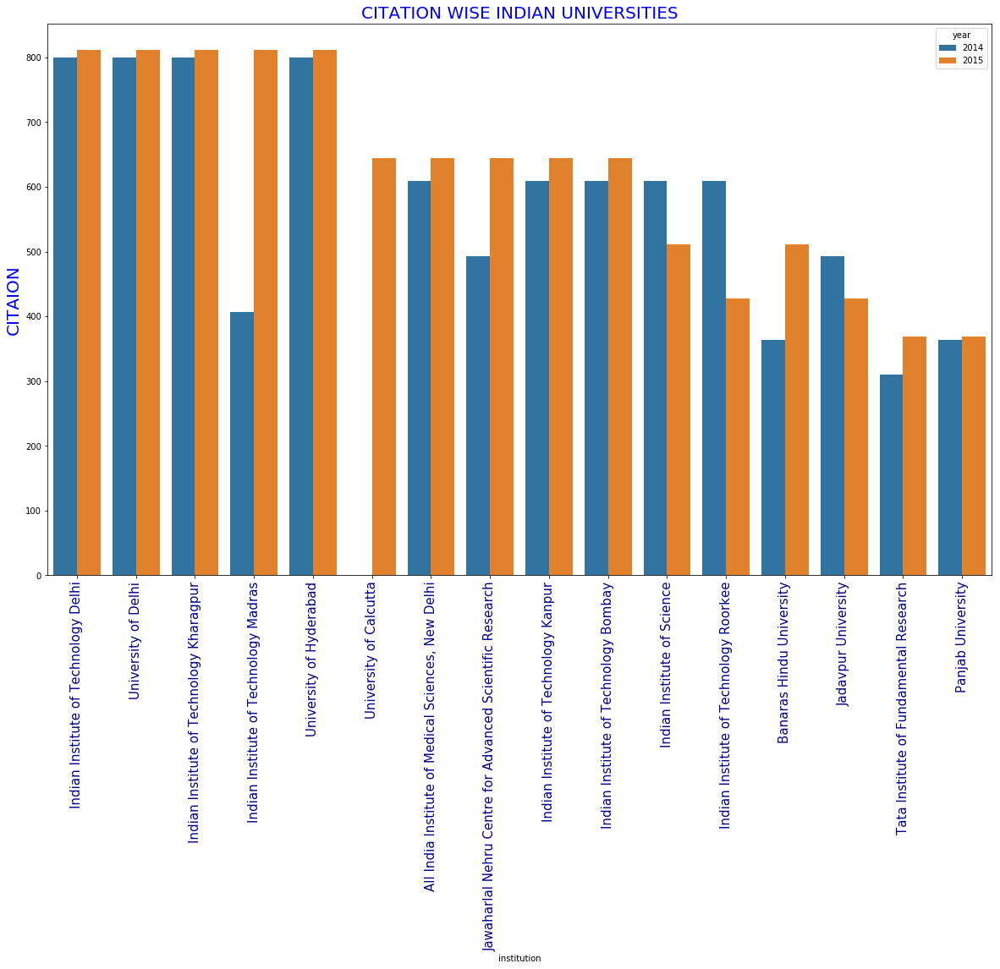

In [40]:
k=cwur[((cwur.year==2015)|(cwur.year==2014))&(cwur.country=='India')][['citations','institution','year']].sort_values(by='citations',ascending=False)
plt.figure(figsize=(20,12))
sns.barplot(x='institution',y='citations',hue='year',data=k)
plt.xticks(rotation=90,fontsize=15,color='darkblue')
plt.title('CITATION WISE INDIAN UNIVERSITIES',fontsize=20,color='blue')
plt.ylabel('CITAION',fontsize=20,color='blue')

plt.show()

# 12. influence wise world university

In [41]:
l1=cwur[cwur.year==2012][['influence','institution','country']].sort_values(by='influence',ascending=False).head(100)
l11=cwur[((cwur.year==2012)&(cwur.country=='France'))][['influence','institution','country']].sort_values(by='influence',ascending=False).head(100)
l1.pivot(columns='country',values='influence').iplot(kind='box',boxpoints='outliers',theme='space')
l11.pivot(columns='country',values='influence').iplot(kind='box',boxpoints='outliers',theme='space')

In [42]:
l2=cwur[cwur.year==2013][['influence','institution','country']].sort_values(by='influence',ascending=False)
l2.pivot(columns='country',values='influence').iplot(kind='box',boxpoints='outliers',theme='space')

In [43]:
l3=cwur[cwur.year==2014][['influence','institution','country']].sort_values(by='influence',ascending=False)#.head(100)
l33=cwur[(cwur.year==2014)&((cwur.country=='Finland')|(cwur.country=='Netherlands')|(cwur.country=='Sweden')|(cwur.country=='Switzerland')|(cwur.country=='Brazil'))][['influence','institution','country']].sort_values(by='influence',ascending=False).head(100)
l3.pivot(columns='country',values='influence').iplot(kind='box',boxpoints='outliers',theme='space')
l33.pivot(columns='country',values='influence').iplot(kind='box',boxpoints='outliers',theme='space')

In [44]:
l4=cwur[cwur.year==2015][['influence','institution','country']].sort_values(by='influence',ascending=False)
l44=cwur[(cwur.year==2015)&((cwur.country=='Finland')|(cwur.country=='India')|(cwur.country=='New Zealand')|(cwur.country=='Switzerland')|(cwur.country=='Germany'))][['influence','institution','country']].sort_values(by='influence',ascending=False).head(100)
l4.pivot(columns='country',values='influence').iplot(kind='box',boxpoints='outliers',theme='space')
l44.pivot(columns='country',values='influence').iplot(kind='box',boxpoints='outliers',theme='space')

In [45]:
l=cwur[(cwur.year==2012)|(cwur.year==2013)|(cwur.year==2014)|(cwur.year==2015)][['year','influence','institution','country']].sort_values(by='influence',ascending=False)
l.iplot(kind='scatter',x='institution',y='influence',mode='markers',size=8,symbol='star',theme='space',color='royalblue')

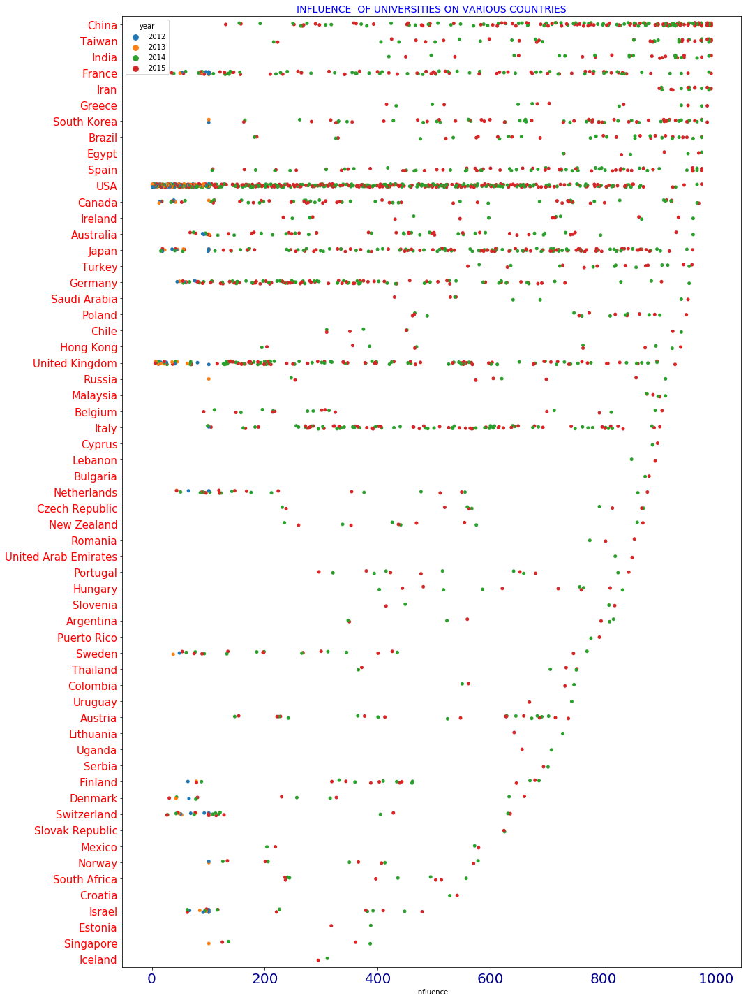

In [46]:
plt.figure(figsize=(15,20))
sns.stripplot(y='country',x='influence',hue='year',data=l,jitter=True)
plt.xticks(fontsize=20,color='darkblue')
plt.yticks(fontsize=15,color='red')
plt.title('INFLUENCE  OF UNIVERSITIES ON VARIOUS COUNTRIES',fontsize=14,color='blue')
plt.ylabel('')


plt.tight_layout()
plt.show()

# 13. influence wise indian university

In [47]:
m1=cwur[(cwur.year==2014)&(cwur.country=='India')][['influence','institution','country']].sort_values(by='influence',ascending=False)
m1.pivot(columns='institution',values='influence').iplot(kind='box',boxpoints='outliers',theme='space')

In [48]:
m2=cwur[(cwur.year==2015)&(cwur.country=='India')][['influence','institution','country']].sort_values(by='influence',ascending=False)
m2.pivot(columns='institution',values='influence').iplot(kind='box',boxpoints='outliers',theme='space')

In [49]:
m=cwur[((cwur.year==2014)|(cwur.year==2015))&(cwur.country=='India')][['year','influence','institution','country']].sort_values(by='influence',ascending=False)
m.iplot(kind='scatter',x='institution',y='influence',mode='markers',size=15,symbol='star',theme='space',color='royalblue')

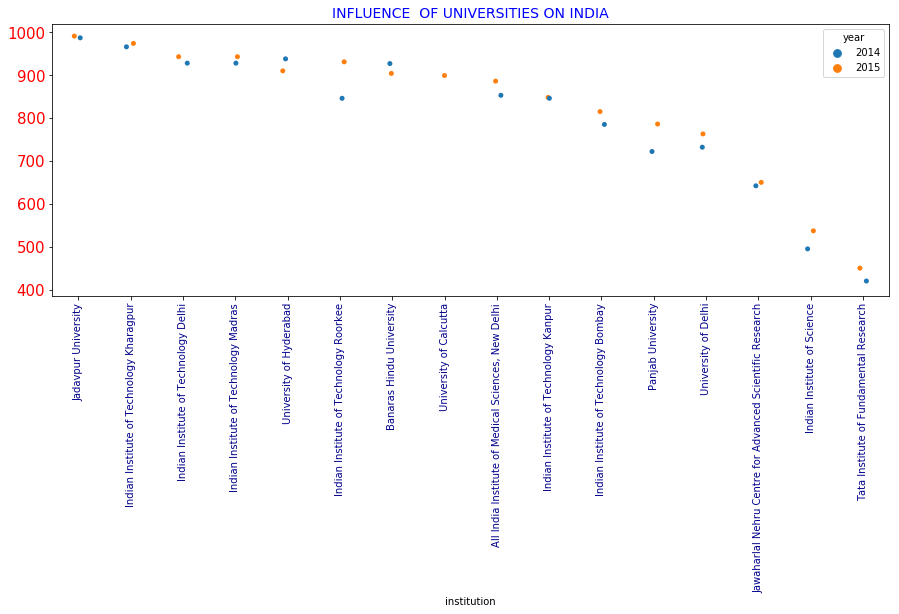

In [50]:
plt.figure(figsize=(15,5))
sns.stripplot(x='institution',y='influence',hue='year',data=m,jitter=True)
plt.xticks(rotation=90,fontsize=10,color='darkblue')
plt.yticks(fontsize=15,color='red')
plt.title('INFLUENCE  OF UNIVERSITIES ON INDIA',fontsize=14,color='blue')
plt.ylabel('')



plt.show()

# 14. quality_of_faculty

In [51]:

n1=cwur[cwur.year==2012][['quality_of_faculty','institution','country']].sort_values(by='quality_of_faculty',ascending=False)
n1.pivot(columns='country',values='quality_of_faculty').iplot(kind='box',boxpoints='outliers',theme='space')

In [52]:
n2=cwur[cwur.year==2013][['quality_of_faculty','institution','country']].sort_values(by='quality_of_faculty',ascending=False)
n2.pivot(columns='country',values='quality_of_faculty').iplot(kind='box',boxpoints='outliers',theme='space')

In [53]:
n3=cwur[(cwur.year==2014)][['quality_of_faculty','institution','country']].sort_values(by='quality_of_faculty',ascending=False)
n3.pivot(columns='country',values='quality_of_faculty').iplot(kind='box',boxpoints='outliers',theme='space')

In [54]:
n4=cwur[cwur.year==2015][['quality_of_faculty','institution','country']].sort_values(by='quality_of_faculty',ascending=False)
n4.pivot(columns='country',values='quality_of_faculty').iplot(kind='box',boxpoints='outliers',theme='space')


In [55]:
n=cwur[(cwur.year==2012)|(cwur.year==2013)|(cwur.year==2014)|(cwur.year==2015)][['year','quality_of_faculty','institution','country']].sort_values(by='quality_of_faculty',ascending=False)


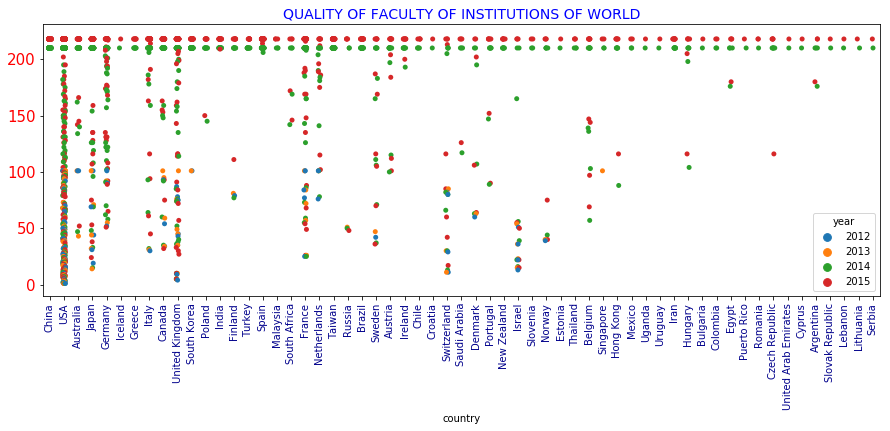

In [56]:
plt.figure(figsize=(15,5))
sns.stripplot(x='country',y='quality_of_faculty',hue='year',data=n,jitter=True)
plt.xticks(rotation=90,fontsize=10,color='darkblue')
plt.yticks(fontsize=15,color='red')
plt.title('QUALITY OF FACULTY OF INSTITUTIONS OF WORLD',fontsize=14,color='blue')
plt.ylabel('')



plt.show()

# 15. quality_of_faculty in India

In [57]:
o1=cwur[(cwur.year==2014)&(cwur.country=='India')][['quality_of_faculty','institution','country']].sort_values(by='quality_of_faculty',ascending=False)
o1.iplot(kind='scatter',x='institution',y='quality_of_faculty',mode='markers',size=15,symbol='star',theme='space',color='royalblue')

In [58]:
o2=cwur[(cwur.year==2015)&(cwur.country=='India')][['quality_of_faculty','institution','country']].sort_values(by='quality_of_faculty',ascending=False)
o2.iplot(kind='scatter',x='institution',y='quality_of_faculty',mode='markers',size=15,symbol='star',theme='space',color='royalblue')

In [59]:
o=cwur[((cwur.year==2014)|(cwur.year==2015))&(cwur.country=='India')][['year','quality_of_faculty','institution','country']].sort_values(by='quality_of_faculty',ascending=False)

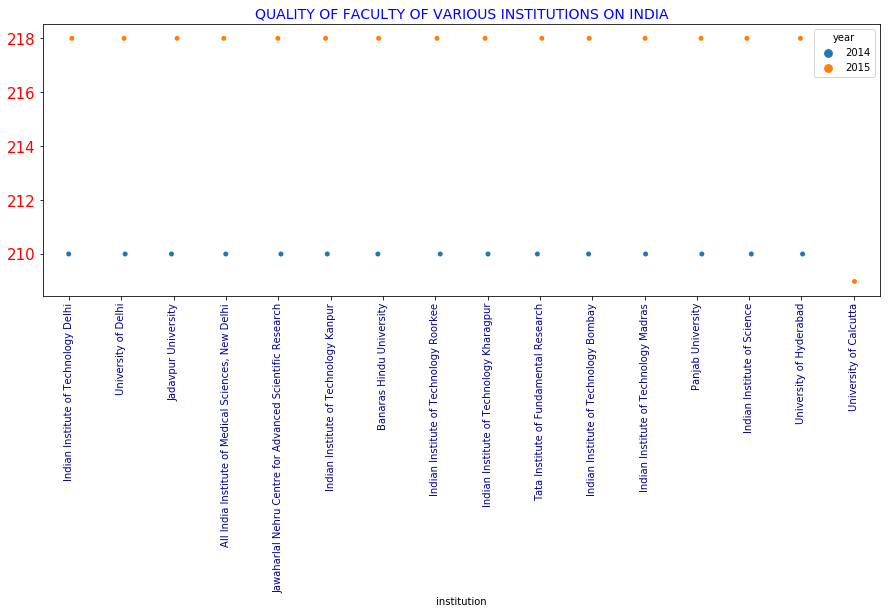

In [60]:
plt.figure(figsize=(15,5))
sns.stripplot(x='institution',y='quality_of_faculty',hue='year',data=o,jitter=True)
plt.xticks(rotation=90,fontsize=10,color='darkblue')
plt.yticks(fontsize=15,color='red')
plt.title('QUALITY OF FACULTY OF VARIOUS INSTITUTIONS ON INDIA',fontsize=14,color='blue')
plt.ylabel('')



plt.show()

# 16. alumni_employment of world

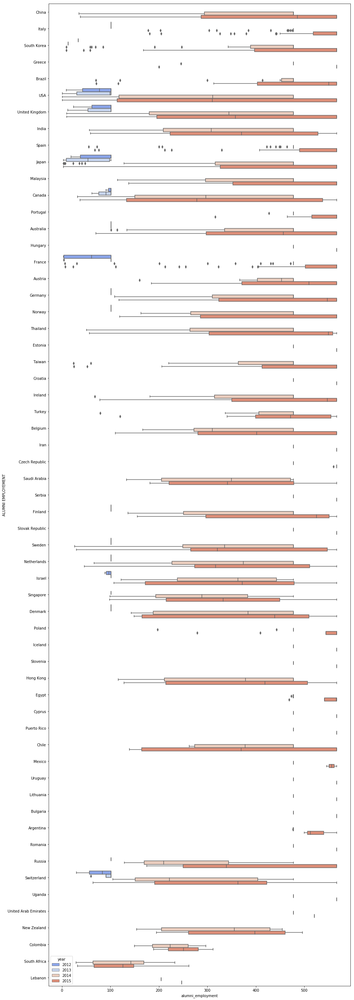

In [61]:

p1=cwur[(cwur.year==2012)|(cwur.year==2013)|(cwur.year==2014)|(cwur.year==2015)][['year','alumni_employment','institution','country']].sort_values(by='alumni_employment',ascending=False)
plt.figure(figsize=(15,50))
sns.boxplot(y='country',x='alumni_employment',hue='year',data=p1,palette='coolwarm')
plt.ylabel('ALUMNI EMPLOYEMENT')
plt.show()

# 17. alumni_employment of india

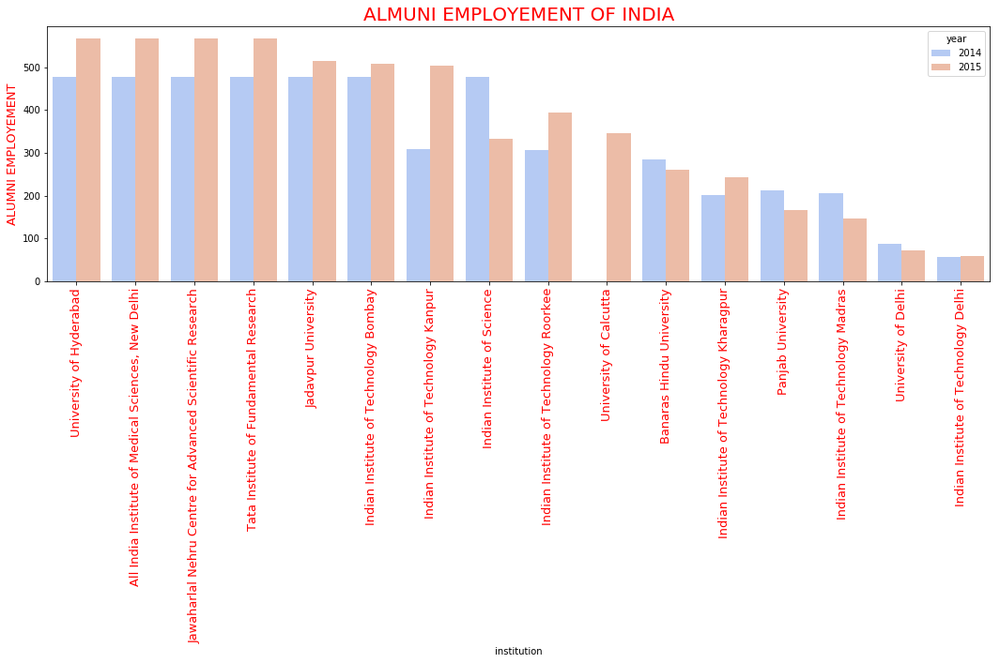

In [62]:

q1=cwur[((cwur.year==2014)|(cwur.year==2015))&(cwur.country=='India')][['year','alumni_employment','institution','country']].sort_values(by='alumni_employment',ascending=False)
plt.figure(figsize=(18,5))
sns.barplot(x='institution',y='alumni_employment',hue='year',data=q1,palette='coolwarm')
plt.xticks(rotation=90,fontsize=13,color='red')
plt.ylabel('ALUMNI EMPLOYEMENT',color='red',fontsize=13)
plt.title('ALMUNI EMPLOYEMENT OF INDIA',color='r',fontsize=20)
plt.show()

# 18. quality_of_education of world

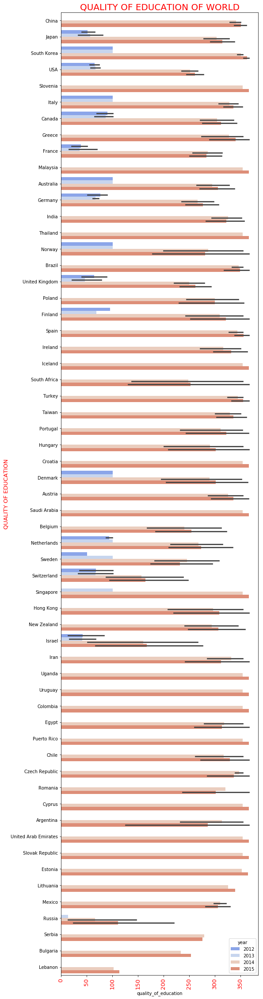

In [63]:

r1=cwur[(cwur.year==2012)|(cwur.year==2013)|(cwur.year==2014)|(cwur.year==2015)][['year','quality_of_education','institution','country']].sort_values(by='quality_of_education',ascending=False)
plt.figure(figsize=(8,40))
sns.barplot(y='country',x='quality_of_education',hue='year',data=r1,palette='coolwarm')
plt.xticks(rotation=90,fontsize=13,color='red')
plt.ylabel('QUALITY OF EDUCATION',color='red',fontsize=13)
plt.title('QUALITY OF EDUCATION OF WORLD',color='r',fontsize=20)
plt.show()

# 19. quality_of_education of india

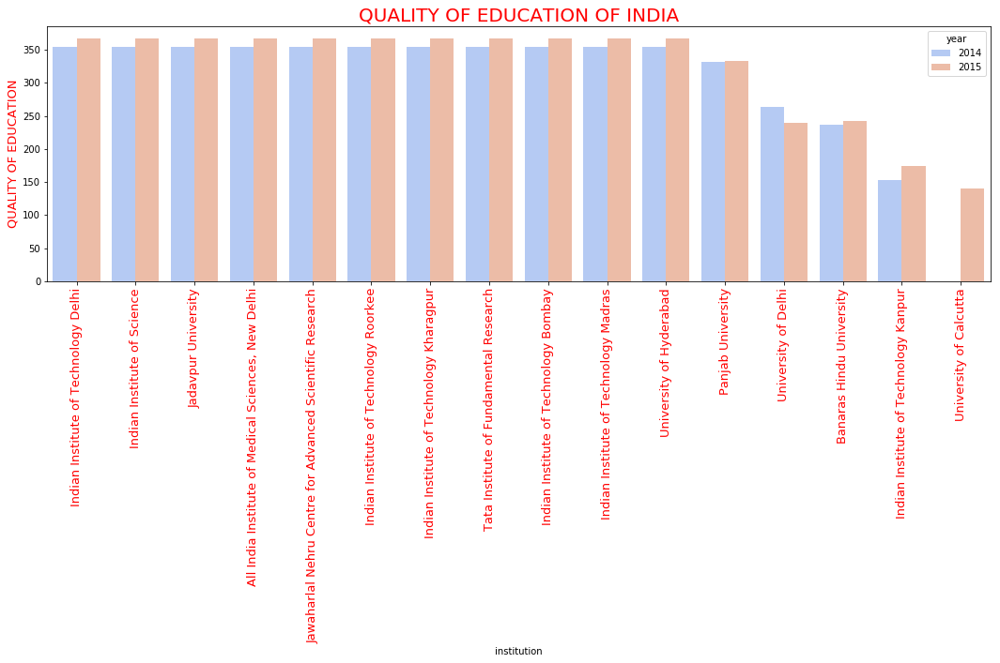

In [64]:

s1=cwur[((cwur.year==2015)|(cwur.year==2014))&(cwur.country=='India')][['year','quality_of_education','institution','country']].sort_values(by='quality_of_education',ascending=False)

plt.figure(figsize=(18,5))
sns.barplot(x='institution',y='quality_of_education',hue='year',data=s1,palette='coolwarm')
plt.xticks(rotation=90,fontsize=13,color='red')
plt.ylabel('QUALITY OF EDUCATION',color='red',fontsize=13)
plt.title('QUALITY OF EDUCATION OF INDIA',color='r',fontsize=20)
plt.show()